<center><p float="center">
  <img src="https://upload.wikimedia.org/wikipedia/commons/e/e9/4_RGB_McCombs_School_Brand_Branded.png" width="300" height="100"/>
  <img src="https://mma.prnewswire.com/media/1458111/Great_Learning_Logo.jpg?p=facebook" width="200" height="100"/>
</p></center>

<h1><center><font size=10>Artificial Intelligence and Machine Learning</center></font></h1>
<h1><center>UnSupervised Learning Project</center></h1>

## Part A

**DOMAIN: Automobile**

**CONTEXT: The data concerns city-cycle fuel consumption in miles per gallon to be predicted in terms of 3 multivalued discrete and 5 continuous attributes.**

**DATA DESCRIPTION**:

* cylinders: multi-valued discrete
    
* acceleration: continuous
    
* displacement: continuous
    
* model year: multi-valued discrete
    
* horsepower: continuous
    
* origin: multi-valued discrete
    
* weight: continuous
    
* car name: string (unique for each instance)
    
* mpg: continuous

**PROJECT OBJECTIVE: To understand K-means Clustering by applying on the Car Dataset to segment the cars into various categories**


In [3]:
# Import required Libraries
import pandas as pd
import numpy as np

# libaries to help with data visualization
import matplotlib.pylab as plt
%matplotlib inline
# To build model for prediction
import seaborn as sns
from sklearn.model_selection  import train_test_split
from sklearn.cluster import KMeans

from scipy.stats import zscore
import warnings

# to evaluate models
from sklearn import metrics
from sklearn.metrics import (
    confusion_matrix,
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
)

# Ignore all warnings
warnings.filterwarnings('ignore')


### Part 1.1 a - Read ‘Car name.csv’ as a DataFrame and assign it to a variable.

In [4]:
df_car1=pd.read_csv('Car name.csv')
df_car=df_car1.copy()
df_car.head()


,car_name
0,chevrolet chevelle malibu
1,buick skylark 320
2,plymouth satellite
3,amc rebel sst
4,ford torino


In [5]:
df_car.shape

(398, 1)

#### Observation :
Car name has 398 rows and one column

### Part 1.1 b - Read ‘Car-Attributes.json as a DataFrame and assign it to a variable.

In [6]:
df_car_attr1=pd.read_json('Car-Attributes.json')
df_car_attr=df_car_attr1.copy()
df_car_attr.head()


,mpg,cyl,disp,hp,wt,acc,yr,origin
0,18.0,8,307.0,130,3504,12.0,70,1
1,15.0,8,350.0,165,3693,11.5,70,1
2,18.0,8,318.0,150,3436,11.0,70,1
3,16.0,8,304.0,150,3433,12.0,70,1
4,17.0,8,302.0,140,3449,10.5,70,1


In [7]:
df_car_attr.shape

(398, 8)

#### Observation :
Car Attributes has 398 rows and 8 column

### Part 1.1 c - Merge both the DataFrames together to form a single DataFrame

In [8]:
#  Merge both the DataFrames together to form a single DataFrame
df_car_merged=pd.concat([df_car,df_car_attr],axis=1)
df_car_merged.head()

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
0,chevrolet chevelle malibu,18.0,8,307.0,130,3504,12.0,70,1
1,buick skylark 320,15.0,8,350.0,165,3693,11.5,70,1
2,plymouth satellite,18.0,8,318.0,150,3436,11.0,70,1
3,amc rebel sst,16.0,8,304.0,150,3433,12.0,70,1
4,ford torino,17.0,8,302.0,140,3449,10.5,70,1


In [9]:
df_car_merged.shape

(398, 9)

#### Observation :
Merged Data frame 398 rows and 9 column

In [10]:
## As car year is model year treating as catogorical variable
df_car_merged['yr']=df_car_merged['yr'].astype(object)
## Also car name we can drop
df_car_merged.drop('car_name',axis=1,inplace=True)

In [11]:
## Replace origin with mapped String
replace_struct={1: 'One', 2: 'two', 3: 'three'}
df_car_merged['origin']=df_car_merged['origin'].map(replace_struct)

In [12]:
df_car_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   mpg     398 non-null    float64
 1   cyl     398 non-null    int64  
 2   disp    398 non-null    float64
 3   hp      398 non-null    object 
 4   wt      398 non-null    int64  
 5   acc     398 non-null    float64
 6   yr      398 non-null    object 
 7   origin  398 non-null    object 
dtypes: float64(3), int64(2), object(3)
memory usage: 25.0+ KB


#### Observation:
Data frame has 5 continous and 3 object type column


### Part 1.1 d - Print 5 point summary of the numerical features and share insights.

In [13]:
df_car_merged.describe().T

,count,mean,std,min,25%,50%,75%,max
mpg,398.0,23.514573,7.815984,9.0,17.500,23.0,29.000,46.6
cyl,398.0,5.454774,1.701004,3.0,4.000,4.0,8.000,8.0
disp,398.0,193.425879,104.269838,68.0,104.250,148.5,262.000,455.0
wt,398.0,2970.424623,846.841774,1613.0,2223.750,2803.5,3608.000,5140.0
acc,398.0,15.568090,2.757689,8.0,13.825,15.5,17.175,24.8


#### Insights from the 5-point summary:
> mpg : Average mpg is 23.5 with min of 9.0 and max of 46.6. 50% of car has mpg 23 or less. There is high variation in mpg with standard daviation of 7.81

> cylinders:: Average number of cyliner in car is 5.45 . While minimum cylinder is 3 and max value of 8. Half of the cars have 4 or fewer cylinders.75% of the cars have 8 or fewer cylinders.

> displacement:: The average displacement is 193.43 . The displacement values vary widely, with a standard deviation of 104.27 cubic inches.  The minimum displacement is 68.0 .  The maximum displacement is 455.0.

> Weight: The average weight is 2970.42. The weight values have a high variability, with a standard deviation of 846.84 pounds.The minimum weight is 1613.0 . The maximum weight is 5140.0 .

> acceleration: The average acceleration is 15.57 seconds. The acceleration values have a moderate variability, with a standard deviation of 2.76 seconds. Minimum acceleration is 8.0 seconds.Maximum acceleration is 24.8 seconds.



### Part 1.2 a - Check and print feature-wise percentage of missing values present in the data and impute with the best suitable approach.

In [14]:
# Check and print feature-wise percentage of missing values present in the data and impute with the best suitable approach.

# Check for missing values
missing_percentage = (df_car_merged.isnull().sum() / len(df_car_merged)) * 100
print(missing_percentage)

mpg       0.0
cyl       0.0
disp      0.0
hp        0.0
wt        0.0
acc       0.0
yr        0.0
origin    0.0
dtype: float64


#### Observation:

There are no missing values in Data Frame

### Part 1.2 b - Check for duplicate values in the data and impute with the best suitable approach.

In [15]:
# Check duplicate values

# Check for duplicate values
df_car_merged.duplicated().sum()


0

#### Observation:
Data Frame has no duplicate values

### Part 1.2 c - Plot a pairplot for all features.

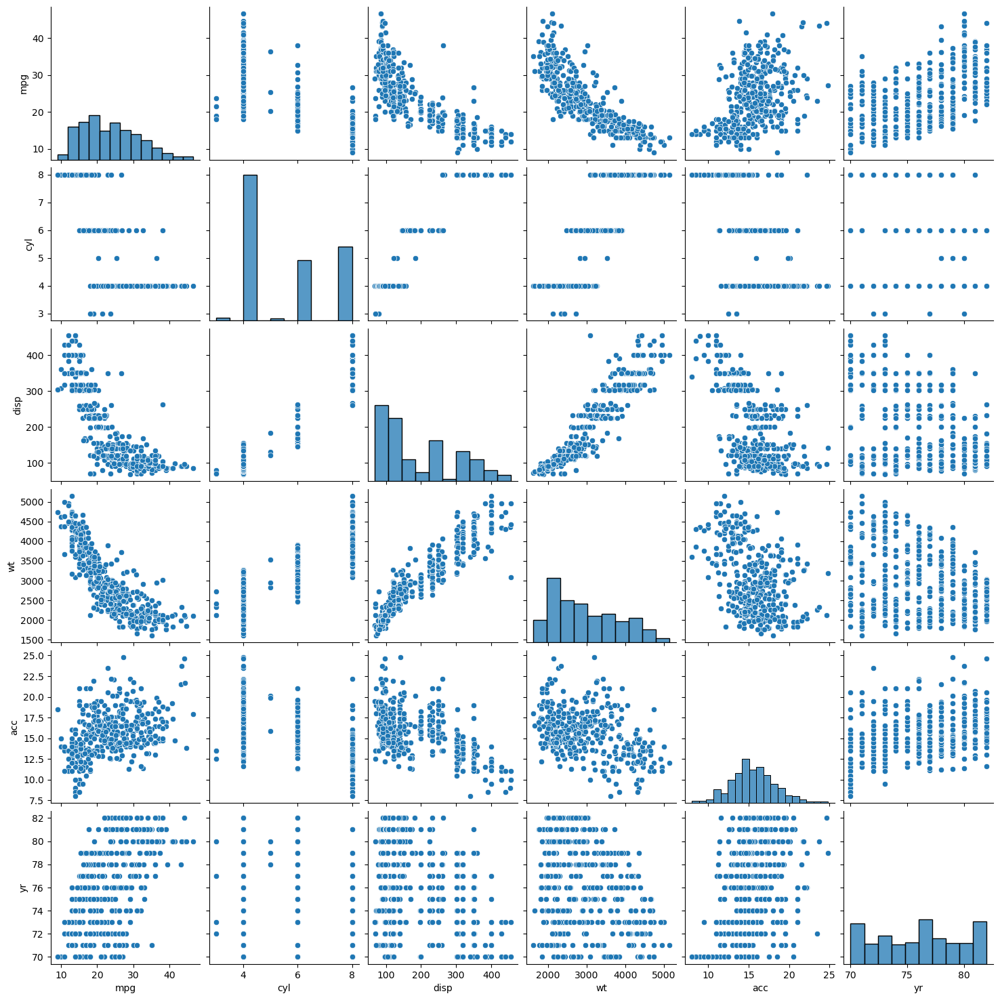

In [16]:
# Plot a pairplot for all features.

sns.pairplot(df_car_merged)
plt.show()


 ### Part 1.2 d - Visualize a scatterplot for ‘wt’ and ‘disp’. Datapoints should be distinguishable by ‘cyl’.

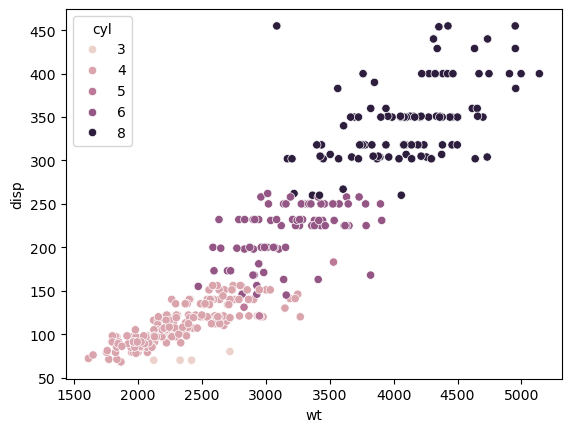

In [17]:
# Visualize a scatterplot for ‘wt’ and ‘disp’. Datapoints should be distinguishable by ‘cyl’.

sns.scatterplot(data=df_car_merged, x="wt", y="disp", hue="cyl")
plt.show()


### Part 1.2 e - Share insights for Q2.d.

#### Insights from the scatter plot:
>  We can see a positive correlation between weight ('wt') and displacement ('disp'). This suggests that heavier cars tend to have larger engines.

> Cars with more cylinders generally have higher weight and displacement. This aligns with the expectation that more cylinders contribute to both weight and engine size.

> There's a clear separation between cars with different cylinder counts. This indicates that 'cyl' is a significant factor influencing both weight and displacement.

### Part 1.2 f - Visualize a scatterplot for ‘wt’ and ’mpg’. Datapoints should be distinguishable by ‘cyl’.

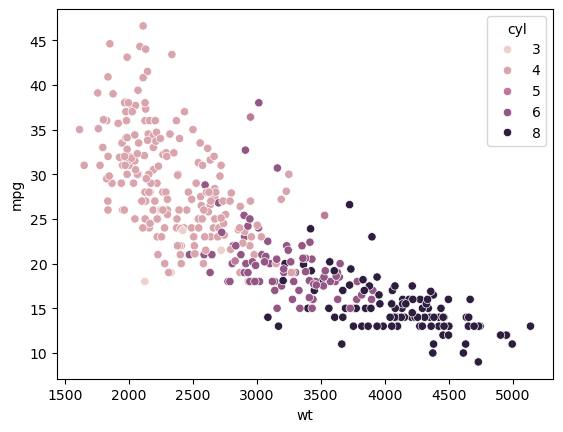

In [18]:
# Visualize a scatterplot for ‘wt’ and ’mpg’. Datapoints should be distinguishable by ‘cyl’.

sns.scatterplot(data=df_car_merged, x="wt", y="mpg", hue="cyl")
plt.show()


### Part 1.2 g- Share insights for Q2.f.

#### Insights from the scatter plot:
> We can see a negative correlation between weight ('wt') and miles per gallon ('mpg'). This indicates that heavier cars tend to have lower fuel efficiency.

> Cars with more cylinders generally have lower mpg and higher weight. This aligns with the understanding that more cylinders often lead to increased fuel consumption and heavier vehicles.

> There's a noticeable clustering of data points based on the number of cylinders. This suggests that 'cyl' is a key factor affecting both weight and fuel efficiency.



### Part 1.2 h - Check for unexpected values in all the features and datapoints with such values.

In [19]:
# Check for unexpected values in all the features and datapoints with such values.

# Check for unexpected values in categorical features
for col in df_car_merged.select_dtypes(include=['object']):
  print(f"Unique values in {col}: {df_car_merged[col].unique()}")



Unique values in hp: [130 165 150 140 198 220 215 225 190 170 160 95 97 85 88 46 87 90 113 200
 210 193 '?' 100 105 175 153 180 110 72 86 70 76 65 69 60 80 54 208 155
 112 92 145 137 158 167 94 107 230 49 75 91 122 67 83 78 52 61 93 148 129
 96 71 98 115 53 81 79 120 152 102 108 68 58 149 89 63 48 66 139 103 125
 133 138 135 142 77 62 132 84 64 74 116 82]
Unique values in yr: [70 71 72 73 74 75 76 77 78 79 80 81 82]
Unique values in origin: ['One' 'three' 'two']


#### Observation:
We can see hp has "?" value which is not expected

In [20]:
# check hp parameter to see how many values has "?"

df_car_merged['hp'].value_counts()['?']


6

In [21]:
df_car_merged[df_car_merged['hp']=='?']

,mpg,cyl,disp,hp,wt,acc,yr,origin
32,25.0,4,98.0,?,2046,19.0,71,One
126,21.0,6,200.0,?,2875,17.0,74,One
330,40.9,4,85.0,?,1835,17.3,80,two
336,23.6,4,140.0,?,2905,14.3,80,One
354,34.5,4,100.0,?,2320,15.8,81,two
374,23.0,4,151.0,?,3035,20.5,82,One


In [22]:
# replace "?" of hp with nan

df_car_merged['hp']=df_car_merged['hp'].replace('?',np.nan)


In [23]:
# fill na with mean of hp group by number of cyliner

df_car_merged['hp'] = df_car_merged['hp'].astype(float)
df_car_merged['hp'] = df_car_merged.groupby('cyl')['hp'].transform(lambda x: x.fillna(x.mean()))


In [24]:
# Filter the DataFrame to show rows where 'hp' was originally '?'
print(df_car_merged[df_car_attr['hp'] == '?'])


      mpg  cyl   disp          hp    wt   acc  yr origin
32   25.0    4   98.0   78.281407  2046  19.0  71    One
126  21.0    6  200.0  101.506024  2875  17.0  74    One
330  40.9    4   85.0   78.281407  1835  17.3  80    two
336  23.6    4  140.0   78.281407  2905  14.3  80    One
354  34.5    4  100.0   78.281407  2320  15.8  81    two
374  23.0    4  151.0   78.281407  3035  20.5  82    One


#### Observation:

Hp has been properly imputed with mean value of respective group of cyl

In [25]:
df_car_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   mpg     398 non-null    float64
 1   cyl     398 non-null    int64  
 2   disp    398 non-null    float64
 3   hp      398 non-null    float64
 4   wt      398 non-null    int64  
 5   acc     398 non-null    float64
 6   yr      398 non-null    object 
 7   origin  398 non-null    object 
dtypes: float64(4), int64(2), object(2)
memory usage: 25.0+ KB


In [26]:
# drop yr and origin column as those are categorical column

df_car_merged.drop(['yr', 'origin'], axis=1, inplace=True)


In [27]:
df_car_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   mpg     398 non-null    float64
 1   cyl     398 non-null    int64  
 2   disp    398 non-null    float64
 3   hp      398 non-null    float64
 4   wt      398 non-null    int64  
 5   acc     398 non-null    float64
dtypes: float64(4), int64(2)
memory usage: 18.8 KB


In [28]:
# scale data using zscore

# Scale the numerical features using z-score scaling
df_car_scaled = df_car_merged.apply(zscore)
df_car_scaled.head()

,mpg,cyl,disp,hp,wt,acc
0,-0.706439,1.498191,1.090604,0.676038,0.630870,-1.295498
1,-1.090751,1.498191,1.503514,1.590766,0.854333,-1.477038
2,-0.706439,1.498191,1.196232,1.198740,0.550470,-1.658577
3,-0.962647,1.498191,1.061796,1.198740,0.546923,-1.295498
4,-0.834543,1.498191,1.042591,0.937389,0.565841,-1.840117


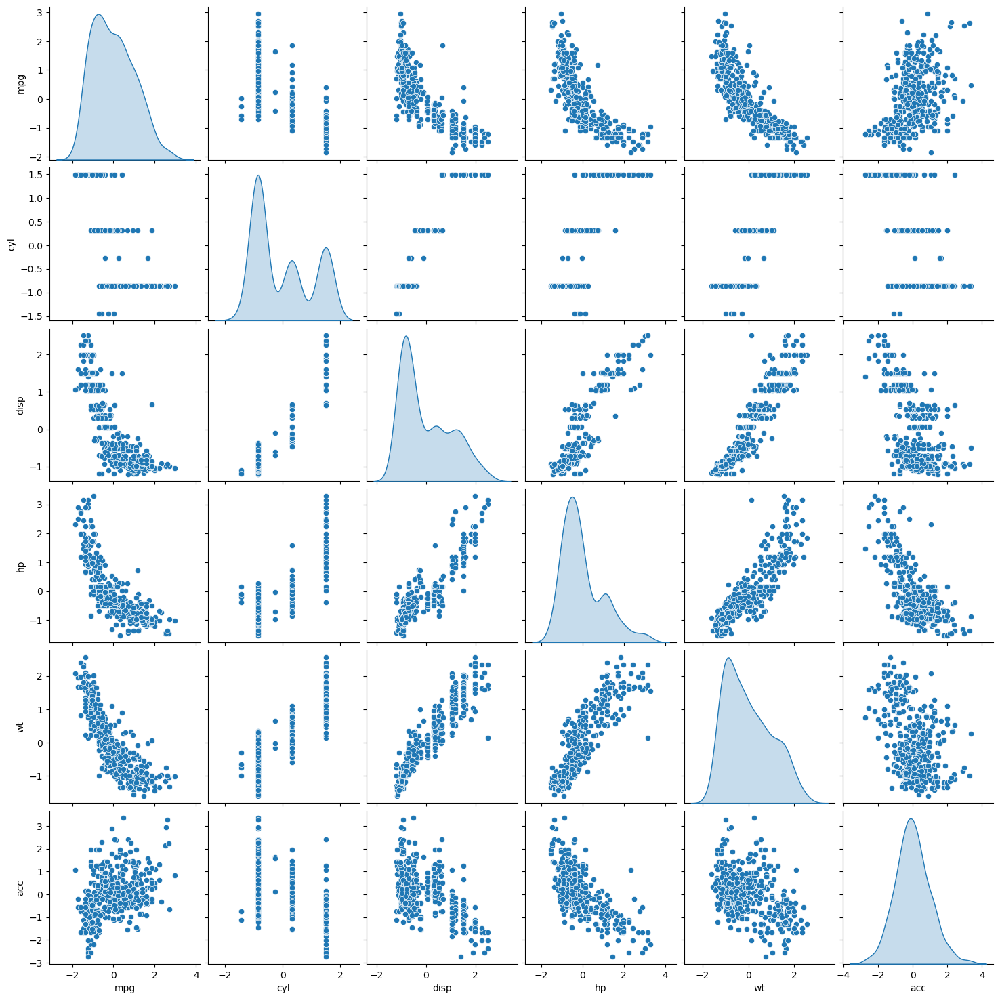

In [29]:
sns.pairplot(df_car_scaled,diag_kind='kde')
plt.show()

### Part 1.3 a - Apply K-Means clustering for 2 to 10 clusters.

In [30]:
from sklearn.cluster import KMeans
#Apply K-Means clustering for 2 to 10 clusters
inertia_values = []
for n_clusters in range(2, 11):
 kmeans = KMeans(n_clusters=n_clusters, random_state=42)
 kmeans.fit(df_car_merged.select_dtypes(include=['number']))
 inertia_values.append(kmeans.inertia_)



### Part 1.3 b - Plot a visual and find elbow point.

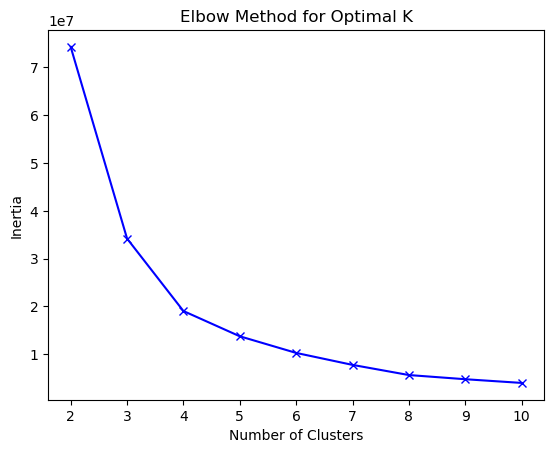

In [31]:
#Plot the Elbow method to find the optimal number of clusters
plt.plot(range(2, 11), inertia_values, 'bx-')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal K')
plt.show()


### Part 1.3 c - On the above visual, highlight which are the possible Elbow points.

### Observation:

From the plot:

* k=2: There is a significant drop in distortion from k=2 to k=3.
* k=3: Another noticeable drop in distortion is seen from k=3 to k=4, though less steep than from k=2 to k=3.
* k=4: After k=4, the curve starts to flatten out more gradually.
* The most prominent elbow points in the plot are at k=3 and k=4

In [32]:
#  We will use K from 3 to 5 and check silhouette_score to see best value of k

from sklearn.metrics import silhouette_score

# Calculate silhouette scores for clusters 3 to 5
silhouette_scores = []
for n_clusters in range(3, 6):
  model = KMeans(n_clusters=n_clusters, random_state=42)
  model.fit(df_car_scaled)
  predicted=model.predict(df_car_scaled)
  silhouette_scores.append(silhouette_score(df_car_scaled, predicted))

# Create a DataFrame to compare silhouette scores
df_silhouette = pd.DataFrame({'Clusters': range(3, 6), 'Silhouette Score': silhouette_scores})
print(df_silhouette)

   Clusters  Silhouette Score
0         3          0.440837
1         4          0.380131
2         5          0.370972


### Observation:

From above table we can see that we are getting best Silhouette  score in k=3 So we will use the same for our final model

### Part 1.3 d - Train a K-means clustering model once again on the optimal number of clusters.

In [33]:
# Let us use k=3 as our final model
final_model=KMeans(n_clusters=3,random_state=42)
final_model.fit(df_car_scaled)
prediction=final_model.predict(df_car_scaled)


In [34]:
# calculate silhouette_score for k=3

from sklearn.metrics import silhouette_score
silhouette_avg = silhouette_score(df_car_scaled, prediction)
print("For n_clusters =", 3, "The average silhouette_score is :", silhouette_avg)


For n_clusters = 3 The average silhouette_score is : 0.4408373194112006


### Part 1.3 e - Add a new feature in the DataFrame which will have labels based upon cluster value

In [35]:

#Append the prediction
df_car_merged["GROUP"] = prediction
df_car_scaled["GROUP"] = prediction
print("Groups Assigned : \n")
df_car_merged.sample(10)

Groups Assigned : 



,mpg,cyl,disp,hp,wt,acc,GROUP
158,16.0,8,318.0,150.000000,4498,14.5,1
79,26.0,4,96.0,69.000000,2189,18.0,0
59,23.0,4,97.0,54.000000,2254,23.5,0
96,13.0,8,360.0,175.000000,3821,11.0,1
330,40.9,4,85.0,78.281407,1835,17.3,0
355,33.7,4,107.0,75.000000,2210,14.4,0
274,20.3,5,131.0,103.000000,2830,15.9,2
239,30.0,4,97.0,67.000000,1985,16.4,0
88,14.0,8,302.0,137.000000,4042,14.5,1
118,24.0,4,116.0,75.000000,2158,15.5,0


#### Observation:

Added Group column to see different assigned cluster to our data

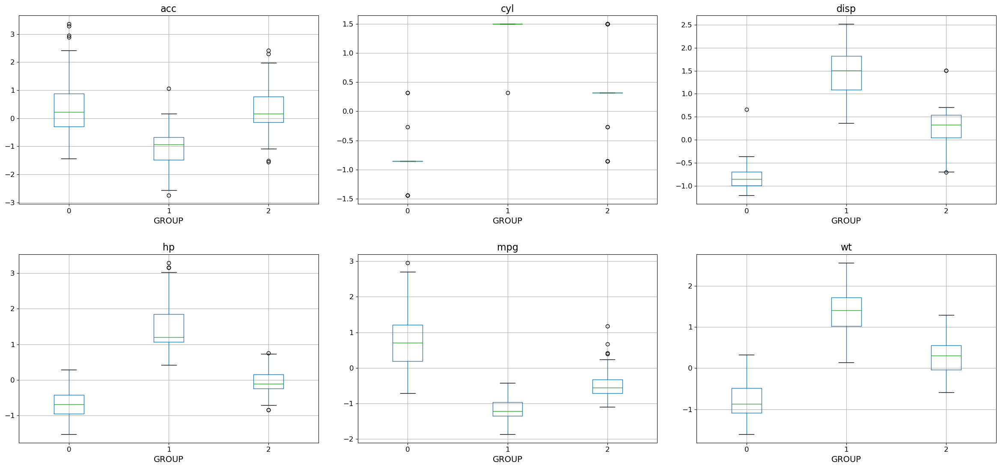

In [36]:
import matplotlib.pyplot as plt

# Determine the number of plots
num_plots = len(df_car_scaled.columns.difference(['GROUP']))
rows = 2
cols = (num_plots + 1) // rows  # Calculate the number of columns needed

# Create a figure with a larger size
fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(24, 12))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# List of columns to plot
columns = df_car_scaled.columns.difference(['GROUP'])

# Plot each column in a separate subplot
for i, col in enumerate(columns):
    df_car_scaled.boxplot(column=col, by='GROUP', ax=axes[i])
    axes[i].set_title(col, fontsize=16)  # Increase the title font size
    axes[i].set_xlabel('GROUP', fontsize=14)  # Increase the xlabel font size
    axes[i].tick_params(axis='x', labelsize=12)  # Increase the x-axis tick label size
    axes[i].tick_params(axis='y', labelsize=12)  # Increase the y-axis tick label size

# Remove the automatic 'Boxplot grouped by' title
plt.suptitle('')

# Adjust layout
plt.tight_layout(pad=3.0)

# Show the plot
plt.show()


In [37]:
# plt.figure(figsize=(24, 12))
# df_car_scaled.boxplot(by='GROUP', layout=(2, 4))
# plt.show()

#### Observation:

From box plot we can see that data different groups are clearly separable

### Part 1.3 f -Plot a visual and color the datapoints based upon clusters.

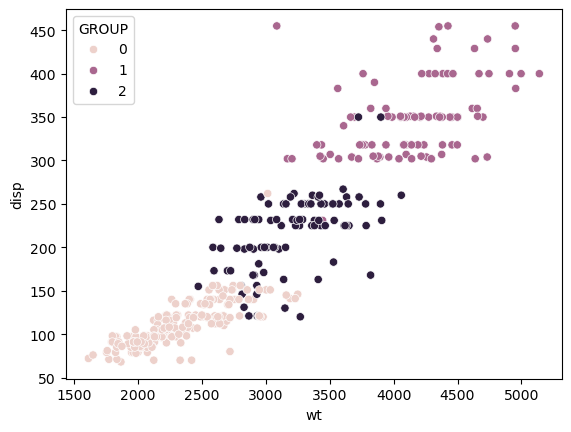

In [38]:
# Visualize a scatterplot for ‘wt’ and ‘disp’ distinguished by cluster

sns.scatterplot(data=df_car_merged, x="wt", y="disp", hue="GROUP")
plt.show()


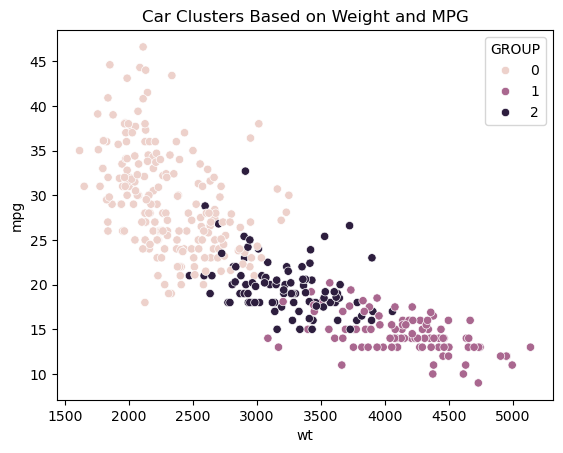

In [39]:
# Scatter plot of 'wt' vs 'mpg', colored by cluster assignment
sns.scatterplot(data=df_car_merged, x="wt", y="mpg", hue="GROUP")
plt.title("Car Clusters Based on Weight and MPG")
plt.show()


### Observation:

From Above Plots we can see that variable are saprable based on group

In [40]:
df_car_merged.sample(10)

,mpg,cyl,disp,hp,wt,acc,GROUP
43,13.0,8,400.0,170.0,4746,12.0,1
39,14.0,8,400.0,175.0,4464,11.5,1
308,33.5,4,151.0,90.0,2556,13.2,0
91,13.0,8,400.0,150.0,4464,12.0,1
93,14.0,8,318.0,150.0,4237,14.5,1
345,35.1,4,81.0,60.0,1760,16.1,0
310,38.1,4,89.0,60.0,1968,18.8,0
102,26.0,4,97.0,46.0,1950,21.0,0
321,32.2,4,108.0,75.0,2265,15.2,0
139,14.0,8,302.0,140.0,4638,16.0,1


### Part 1.3 g - Pass a new DataPoint and predict which cluster it belongs to.

In [41]:
# Define the new data point (replace with your actual values)
new_data_point = pd.DataFrame([[20, 4, 140 ,120, 2500, 15]],
                             columns=['mpg', 'cyl', 'disp','hp', 'wt', 'acc'])
print(new_data_point)


# Predict the cluster for the new data point
predicted_cluster = final_model.predict(new_data_point)

print("The new data point belongs to cluster:", predicted_cluster[0])


   mpg  cyl  disp   hp    wt  acc
0   20    4   140  120  2500   15
The new data point belongs to cluster: 1


## Part B

**DOMAIN: Automobile**

**CONTEXT: The purpose is to classify a given silhouette as one of three types of vehicle, using a set of features extracted from the silhouette. The
vehicle may be viewed from one of many different angles.**

**DATA DESCRIPTION**:
The data contains features extracted from the silhouette of vehicles in different angles. Four "Corgie" model vehicles were
used for the experiment: a double decker bus, Cheverolet van, Saab 9000 and an Opel Manta 400 cars. This particular combination of vehicles
was chosen with the expectation that the bus, van and either one of the cars would be readily distinguishable, but it would be more difficult to
distinguish between the cars

• All the features are numeric i.e. geometric features extracted from the silhouette.

**PROJECT OBJECTIVE: Apply dimensionality reduction technique – PCA and train a model and compare relative results**


### Part 2. 1 a - Read ‘vehicle.csv’ and save as DataFrame.

In [42]:
#reading the CSV file into pandas dataframe
vehicle_df=pd.read_csv("vehicle.csv")
#Check top 5 records of the dataset
vehicle_df.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [43]:
vehicle_df.shape

(846, 19)

### Observation:
There are 846 rows and 19 columns

In [44]:
vehicle_df.describe().T

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,93.678487,8.234474,73.0,87.00,93.0,100.0,119.0
circularity,841.0,44.828775,6.152172,33.0,40.00,44.0,49.0,59.0
distance_circularity,842.0,82.110451,15.778292,40.0,70.00,80.0,98.0,112.0
radius_ratio,840.0,168.888095,33.520198,104.0,141.00,167.0,195.0,333.0
pr.axis_aspect_ratio,844.0,61.678910,7.891463,47.0,57.00,61.0,65.0,138.0
max.length_aspect_ratio,846.0,8.567376,4.601217,2.0,7.00,8.0,10.0,55.0
scatter_ratio,845.0,168.901775,33.214848,112.0,147.00,157.0,198.0,265.0
elongatedness,845.0,40.933728,7.816186,26.0,33.00,43.0,46.0,61.0
pr.axis_rectangularity,843.0,20.582444,2.592933,17.0,19.00,20.0,23.0,29.0
max.length_rectangularity,846.0,147.998818,14.515652,118.0,137.00,146.0,159.0,188.0


### Observation
* It gives the descriptive statistics (mean, median, mode, percentiles, min, max, standard deviation) of the columns of the dataset.
* By analysing it, we can see that
  
  -compactness, circularity, distance_circularity, elongatedness, pr.axis_rectangularity, max.length_rectangularity, scaled_radius_of_gyration, scaled_radius_of_gyration.1, skewness_about.2, hollows_ratio are approximately normally distributed.
    
    -radius_ratio, pr.axis_aspect_ratio, max.length_aspect_ratio, scatter_ratio, scaled_variance, scaled_variance.1, skewness_about, skewness_about.1 are approx. right skewed distribution.
  

In [45]:
vehicle_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  841 non-null    float64
 2   distance_circularity         842 non-null    float64
 3   radius_ratio                 840 non-null    float64
 4   pr.axis_aspect_ratio         844 non-null    float64
 5   max.length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                845 non-null    float64
 7   elongatedness                845 non-null    float64
 8   pr.axis_rectangularity       843 non-null    float64
 9   max.length_rectangularity    846 non-null    int64  
 10  scaled_variance              843 non-null    float64
 11  scaled_variance.1            844 non-null    float64
 12  scaled_radius_of_gyration    844 non-null    float64
 13  scaled_radius_of_gyr

### Observation :
Data frame has 18 numerical column and class as object column

In [46]:
# Checking different values present in class column
vehicle_df['class'].value_counts()

class
car    429
bus    218
van    199
Name: count, dtype: int64

In [47]:
#class attribute is not an object it is a category
vehicle_df['class']=vehicle_df['class'].astype('category')

### Part 2.1 b- Check percentage of missing values and impute with correct approach.

In [48]:
# Check percentage of missing values and impute with correct approach.

# Check for missing values
missing_percentage = (vehicle_df.isnull().sum() / len(vehicle_df)) * 100
print(missing_percentage)

compactness                    0.000000
circularity                    0.591017
distance_circularity           0.472813
radius_ratio                   0.709220
pr.axis_aspect_ratio           0.236407
max.length_aspect_ratio        0.000000
scatter_ratio                  0.118203
elongatedness                  0.118203
pr.axis_rectangularity         0.354610
max.length_rectangularity      0.000000
scaled_variance                0.354610
scaled_variance.1              0.236407
scaled_radius_of_gyration      0.236407
scaled_radius_of_gyration.1    0.472813
skewness_about                 0.709220
skewness_about.1               0.118203
skewness_about.2               0.118203
hollows_ratio                  0.000000
class                          0.000000
dtype: float64


In [49]:
#replace missing variable('?') into null variable using numpy
vehicle_df = vehicle_df.replace(' ', np.nan)

In [50]:
#Replacing the missing values by median
for i in vehicle_df.columns[:17]:
    median_value = vehicle_df[i].median()
    vehicle_df[i] = vehicle_df[i].fillna(median_value)

In [51]:
vehicle_df.isna().sum()

compactness                    0
circularity                    0
distance_circularity           0
radius_ratio                   0
pr.axis_aspect_ratio           0
max.length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
pr.axis_rectangularity         0
max.length_rectangularity      0
scaled_variance                0
scaled_variance.1              0
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    0
skewness_about                 0
skewness_about.1               0
skewness_about.2               0
hollows_ratio                  0
class                          0
dtype: int64

### Observation:
Imputed missing values with median now there are no missing values

### Part 2.1 c- Visualize a Pie-chart and print percentage of values for variable ‘class’.

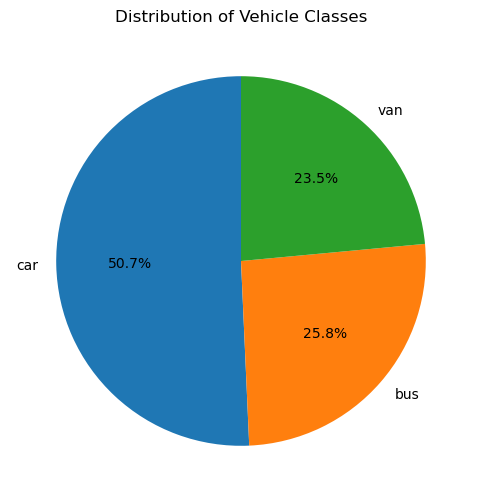

class
car    50.709220
bus    25.768322
van    23.522459
Name: count, dtype: float64


In [52]:
# Calculate percentage of values for 'class'
class_counts = vehicle_df['class'].value_counts()
class_percentages = (class_counts / class_counts.sum()) * 100

# Create a pie chart
plt.figure(figsize=(8, 6))
plt.pie(class_percentages, labels=class_percentages.index, autopct='%1.1f%%', startangle=90)
plt.title('Distribution of Vehicle Classes')
plt.show()

# Print percentage of values
print(class_percentages)


### Observation:
From above chart we can see different class of vehicle . 50.70% are car , 25.76% are bus and 23.52% are van

### Part 2.1 d - Check for duplicate rows in the data and impute with correct approach.

In [53]:
# Check for duplicate rows
duplicate_rows = vehicle_df.duplicated().sum()
print("Number of duplicate rows:", duplicate_rows)


Number of duplicate rows: 0


### Observation:
There is no duplicate data

### Univariate Analysis

In [54]:
vehicle_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   compactness                  846 non-null    int64   
 1   circularity                  846 non-null    float64 
 2   distance_circularity         846 non-null    float64 
 3   radius_ratio                 846 non-null    float64 
 4   pr.axis_aspect_ratio         846 non-null    float64 
 5   max.length_aspect_ratio      846 non-null    int64   
 6   scatter_ratio                846 non-null    float64 
 7   elongatedness                846 non-null    float64 
 8   pr.axis_rectangularity       846 non-null    float64 
 9   max.length_rectangularity    846 non-null    int64   
 10  scaled_variance              846 non-null    float64 
 11  scaled_variance.1            846 non-null    float64 
 12  scaled_radius_of_gyration    846 non-null    float64 
 13  scale

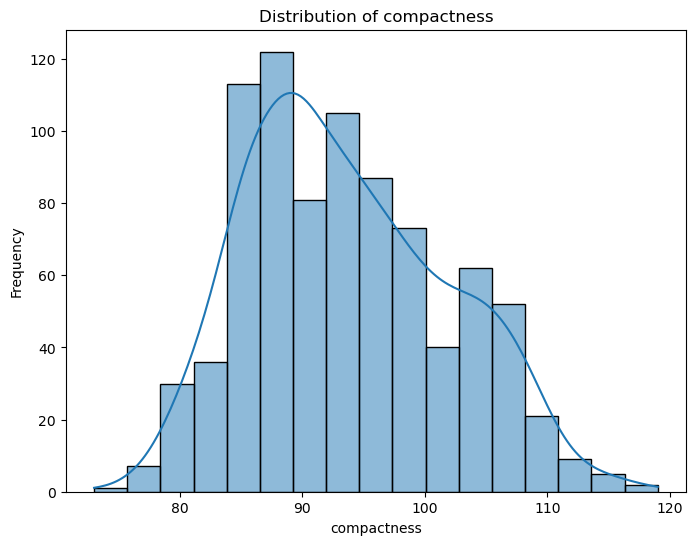

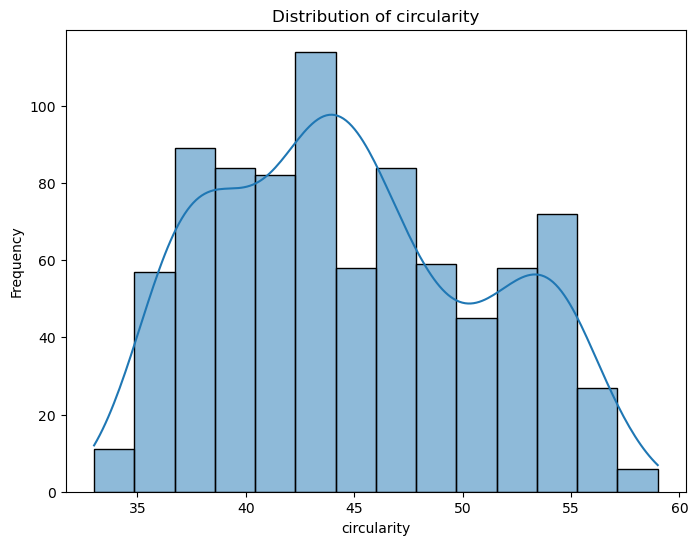

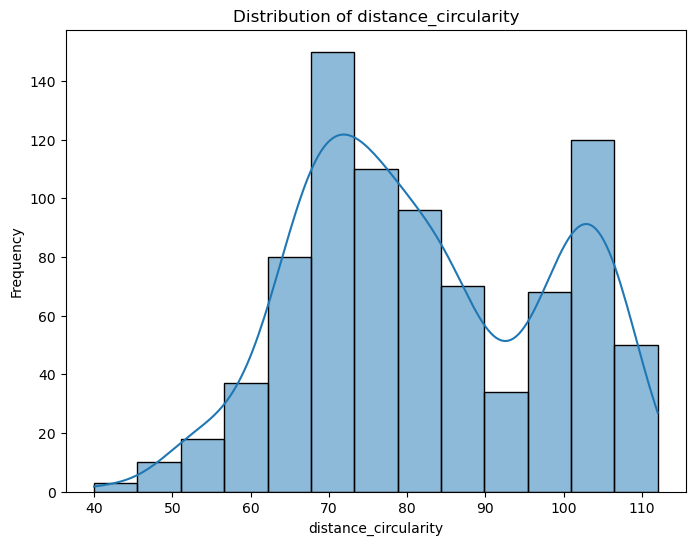

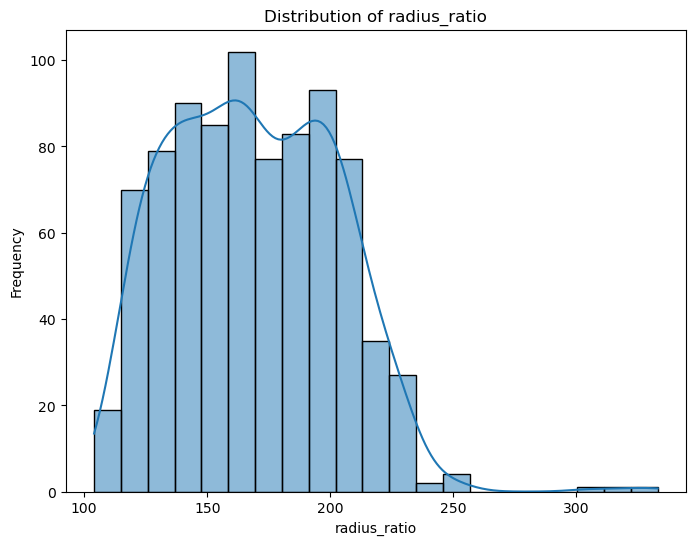

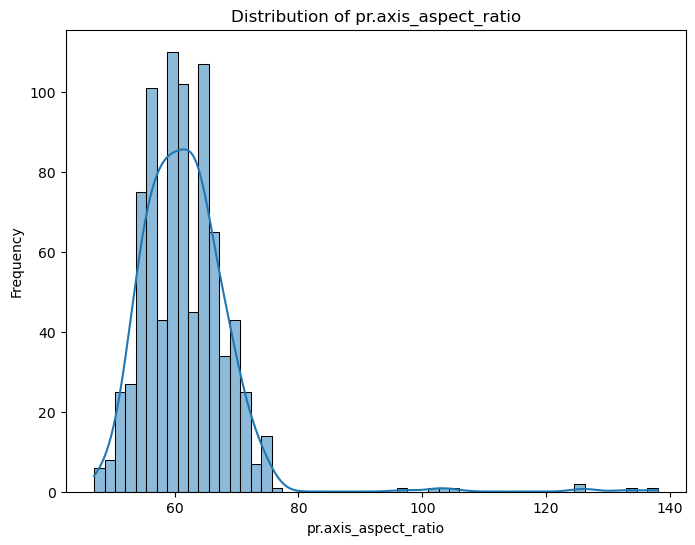

...

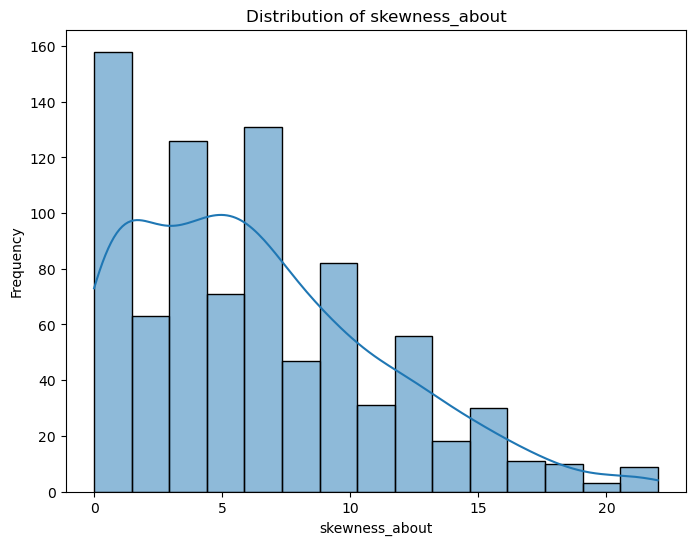

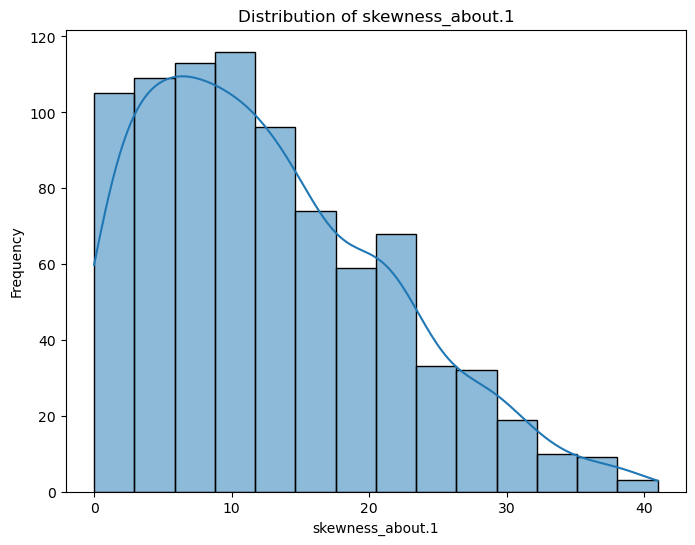

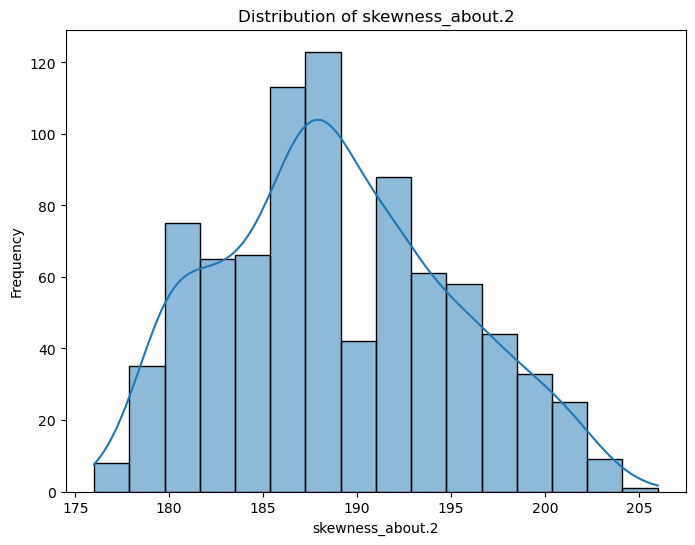

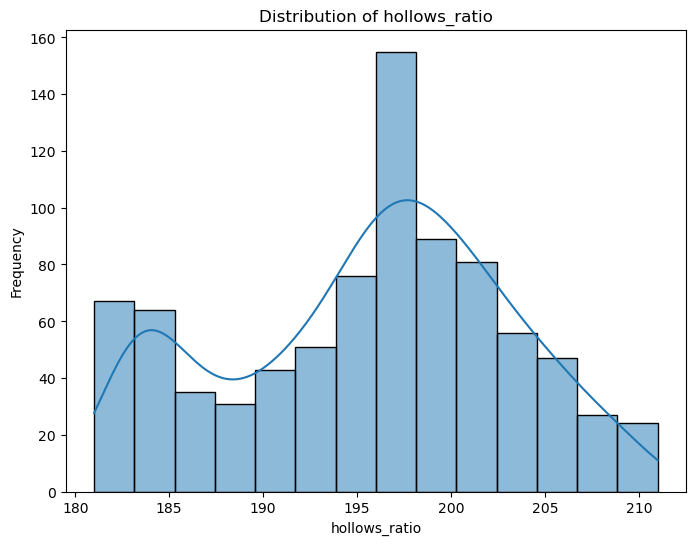

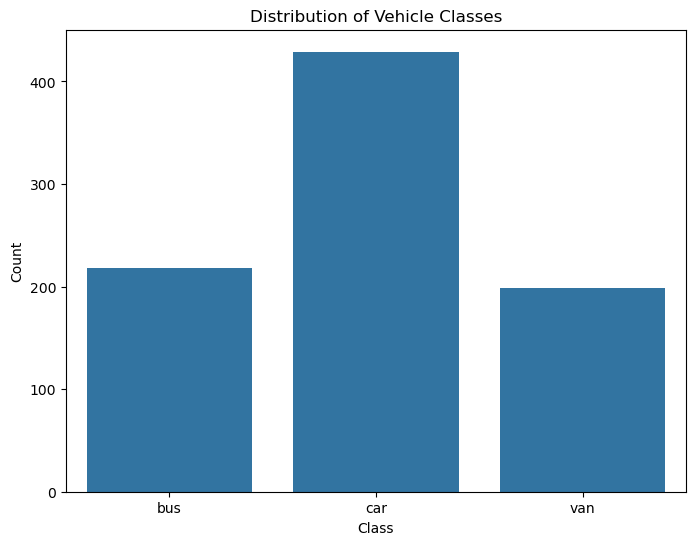

In [55]:
# prompt: Do Univariate analysis vehicle_df

# Univariate analysis for numerical features
numerical_features = vehicle_df.select_dtypes(include=['number']).columns

for feature in numerical_features:
    plt.figure(figsize=(8, 6))
    sns.histplot(vehicle_df[feature], kde=True)
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.show()

# Univariate analysis for categorical feature ('class')
plt.figure(figsize=(8, 6))
sns.countplot(x='class', data=vehicle_df)
plt.title('Distribution of Vehicle Classes')
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()

**Numerical Features:**

> compactness: The distribution appears to be approximately normal, with a slight right skew.

> circularity: The distribution is unimodal and roughly symmetrical, resembling a normal distribution.

> distance_circularity: The distribution is unimodal and slightly right-skewed.

> radius_ratio: Distribution is right skewed. There are some outliers present on the higher end.

> pr.axis_aspect_ratio: The distribution is right-skewed with a peak around 20.

> max.length_aspect_ratio: The distribution is heavily right-skewed with most values concentrated around low values.

> scatter_ratio: The distribution is right-skewed with a long tail.

> elongatedness: The distribution is unimodal and approximately symmetrical.

> pr.axis_rectangularity: The distribution is unimodal and slightly right-skewed.

> max.length_rectangularity: The distribution is unimodal and slightly right-skewed.

> scaled_variance: The distribution is right-skewed with a long tail.

> scaled_variance.1: The distribution is right-skewed with a long tail, similar to 'scaled_variance'.

> scaled_radius_of_gyration: The distribution is unimodal and approximately normal.

> scaled_radius_of_gyration.1: The distribution is unimodal and approximately normal.

> skewness_about: The distribution is right-skewed with a long tail.

> skewness_about.1: The distribution is right-skewed with a long tail, similar to 'skewness_about'.

> skewness_about.2: The distribution is unimodal and approximately symmetrical.

> hollows_ratio: The distribution is unimodal and approximately symmetrical.

**Categorical Feature:**

> class: The 'car' class has the highest count, followed by 'bus' and then 'van'. The distribution suggests an imbalance in the dataset with 'car' being the majority class

### Multivariate Analysis

In [56]:
#correlation matrix
cor=vehicle_df.corr(numeric_only=True)
cor

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
compactness,1.000000,0.684887,0.789928,0.689743,0.091534,0.148249,0.812620,-0.788750,0.813694,0.676143,0.762070,0.814012,0.585243,-0.249593,0.236078,0.157015,0.298537,0.365552
circularity,0.684887,1.000000,0.792320,0.620912,0.153778,0.251467,0.847938,-0.821472,0.843400,0.961318,0.796306,0.835946,0.925816,0.051946,0.144198,-0.011439,-0.104426,0.046351
distance_circularity,0.789928,0.792320,1.000000,0.767035,0.158456,0.264686,0.905076,-0.911307,0.893025,0.774527,0.861519,0.886017,0.705771,-0.225944,0.113924,0.265547,0.146098,0.332732
radius_ratio,0.689743,0.620912,0.767035,1.000000,0.663447,0.450052,0.734429,-0.789481,0.708385,0.568949,0.793415,0.718436,0.536372,-0.180397,0.048713,0.173741,0.382214,0.471309
pr.axis_aspect_ratio,0.091534,0.153778,0.158456,0.663447,1.000000,0.648724,0.103732,-0.183035,0.079604,0.126909,0.272910,0.089189,0.121971,0.152950,-0.058371,-0.031976,0.239886,0.267725
max.length_aspect_ratio,0.148249,0.251467,0.264686,0.450052,0.648724,1.000000,0.166191,-0.180140,0.161502,0.305943,0.318957,0.143253,0.189743,0.295735,0.015599,0.043422,-0.026081,0.143919
scatter_ratio,0.812620,0.847938,0.905076,0.734429,0.103732,0.166191,1.000000,-0.971601,0.989751,0.809083,0.948662,0.993012,0.799875,-0.027542,0.074458,0.212428,0.005628,0.118817
elongatedness,-0.788750,-0.821472,-0.911307,-0.789481,-0.183035,-0.180140,-0.971601,1.000000,-0.948996,-0.775854,-0.936382,-0.953816,-0.766314,0.103302,-0.052600,-0.185053,-0.115126,-0.216905
pr.axis_rectangularity,0.813694,0.843400,0.893025,0.708385,0.079604,0.161502,0.989751,-0.948996,1.000000,0.810934,0.934227,0.988213,0.796690,-0.015495,0.083767,0.214700,-0.018649,0.099286
max.length_rectangularity,0.676143,0.961318,0.774527,0.568949,0.126909,0.305943,0.809083,-0.775854,0.810934,1.000000,0.744985,0.794615,0.866450,0.041622,0.135852,0.001366,-0.103948,0.076770


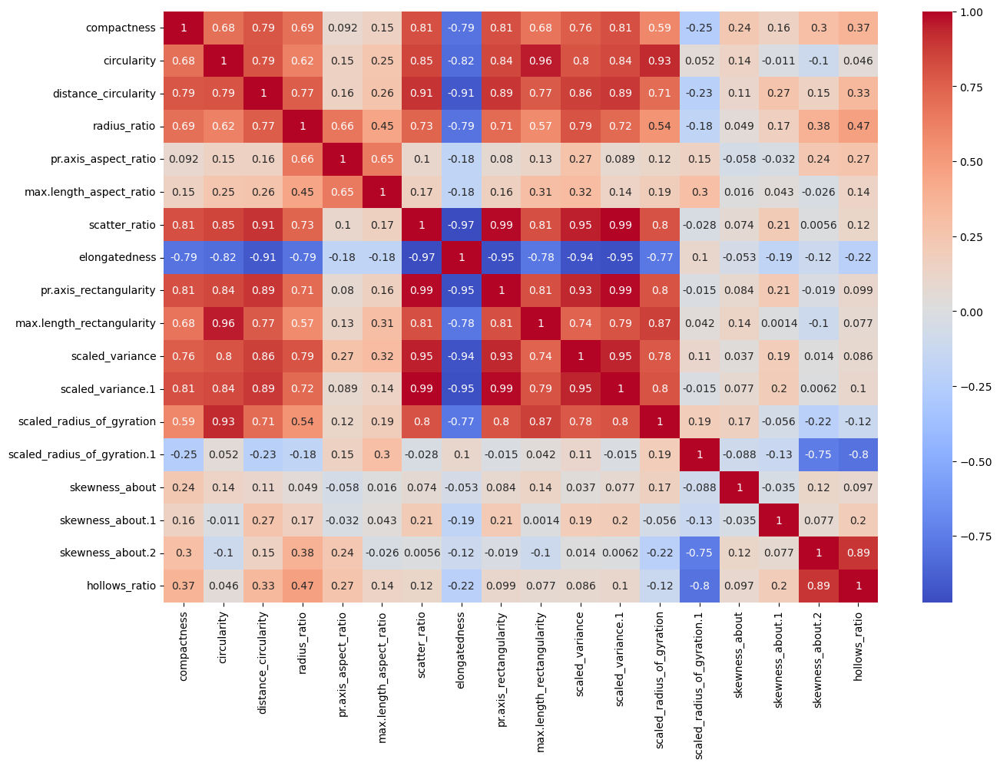

In [57]:
# prompt: Create HeatMap using above correlation matrix

# Heatmap to visualize correlations
plt.figure(figsize=(15,10))
sns.heatmap(cor,annot=True, cmap='coolwarm')
plt.show()


### Observation
* It shows that there are some attributes which are highly correlated as there corelation value is very high.
* For example: compactness is highly correlated in a positive way with scatter_ratio, pr.axis_rectangularity, scaled_variance1, distance_circularity, scaled_variance, radius_ratio. compactness is highly correlated in a negative way with elongatedness.

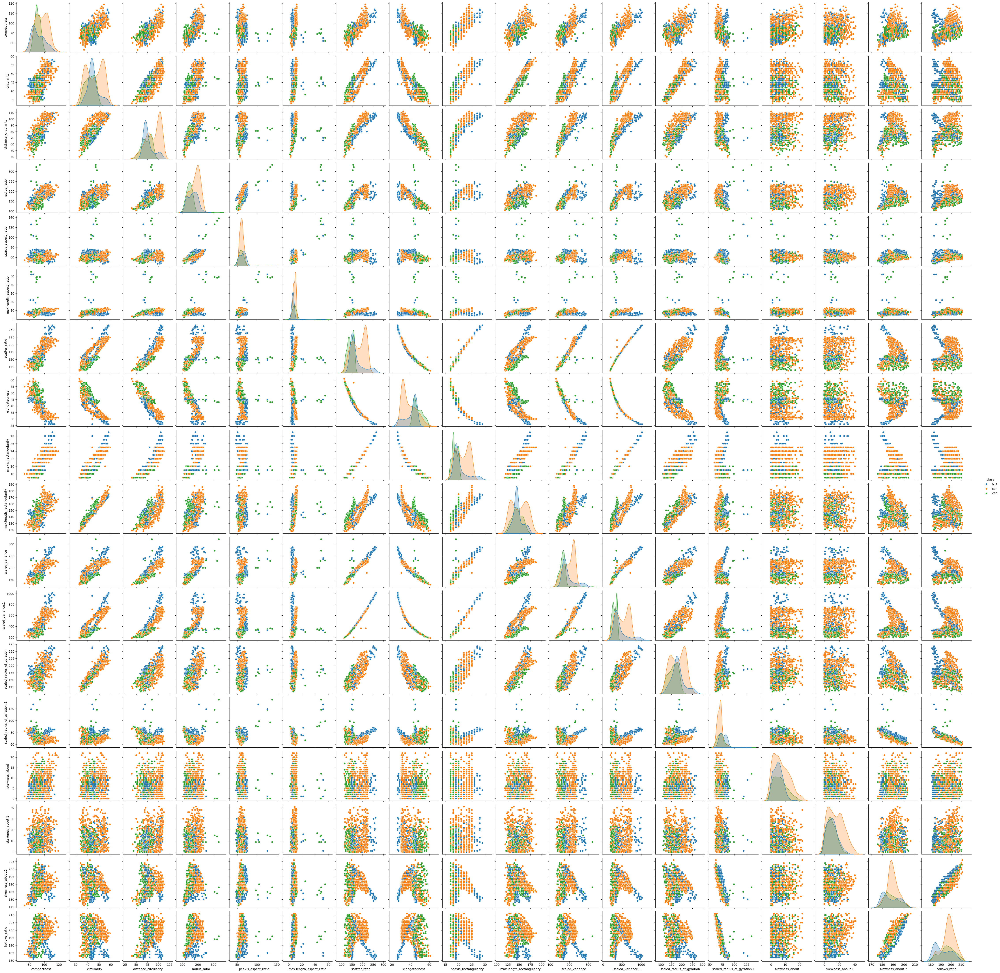

In [58]:
#pair plot
sns.pairplot(vehicle_df,hue='class')

### Observation
* It is also showing the same information as correlation matrix.
* compactness has positive linear relationship with circularity, distance_circularity, radius_ratio, scatter_ratio, pr.axis_rectangularity, max.axis_rectangularity, scaled_variance1, scaled_variance. compactness has negative linear relationship with elongatedness.
* circularity has positive linear relationship with distance_circularity, scatter_ratio, pr.axis_rectangularity, max.axis_rectangularity, scaled_variance, scaled_variance1, scaled_radius_of_gyration. circularity has negative linear relationship with elongatedness.
* distance_circularity has positive linear relationship with radius_ratio, scatter_ratio, pr.axis_rectangularity, max.axis_rectangularity, scaled_variance, scaled_variance1, scaled_radius_of_gyration. distance_circularity has negative linear relationship with elongatedness.
* radius_ratio has positive linear relationship with pr.axis_aspect_ratio, scatter_ratio, scaled_variance, scaled_variance1, scaled_radius_of_gyration. radius_ratio has negative linear relationship with elongatedness.

### Part 2.2 a - Split data into X and Y.

In [59]:
#importing the Encoding library
from sklearn.preprocessing import LabelEncoder
#Encoding of categorical variables
labelencoder_X=LabelEncoder()
vehicle_df['class']=labelencoder_X.fit_transform(vehicle_df['class'])

In [60]:
# Split data into X and Y
X = vehicle_df.drop('class', axis=1)
y = vehicle_df['class']


In [61]:
X.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183


In [62]:
y.head()

0    2
1    2
2    1
3    2
4    0
Name: class, dtype: int32

### Part 2.2 b - Standardize the Data.


In [63]:
from sklearn.preprocessing import StandardScaler

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)



In [64]:
X_scaled

array([[ 0.16058035,  0.51807313,  0.05717723, ...,  0.3808703 ,
        -0.31201194,  0.18395733],
       [-0.32546965, -0.62373151,  0.12074088, ...,  0.15679779,
         0.01326483,  0.45297703],
       [ 1.25419283,  0.84430302,  1.51914112, ..., -0.40338349,
        -0.14937355,  0.04944748],
       ...,
       [ 1.49721783,  1.49676282,  1.20132288, ..., -0.96356477,
        -0.31201194,  0.72199673],
       [-0.93303214, -1.43930625, -0.26064101, ...,  1.38919659,
         0.17590322, -0.08506238],
       [-1.05454464, -1.43930625, -1.02340478, ...,  0.60494281,
        -0.47465032, -0.75761164]])

### Part 2.3 a - Train a base Classification model using SVM.

In [65]:
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    average="macro"

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred,average=average)  # to compute Recall
    precision = precision_score(target, pred,average=average)  # to compute Precision
    f1 = f1_score(target, pred,average=average)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {"Accuracy": acc, "Recall": recall, "Precision": precision, "F1": f1,},
        index=[0],
    )

    return df_perf

In [66]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Create an SVM classifier
svm_classifier = SVC()

# Train the classifier
svm_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = svm_classifier.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy of base SVM model:", accuracy)


Accuracy of base SVM model: 0.9647058823529412


In [67]:
svm_base_mode_perf_test=model_performance_classification_sklearn(svm_classifier,X_test,y_test)
svm_base_mode_perf_test

,Accuracy,Recall,Precision,F1
0,0.964706,0.963889,0.963532,0.963223


### Part 2.3 b - Print Classification metrics for train data.


In [68]:

# Make predictions on the train set
y_train_pred = svm_classifier.predict(X_train)

# Calculate classification metrics for train data
from sklearn.metrics import classification_report
print("Classification Report for Train Data:\n", classification_report(y_train, y_train_pred))


Classification Report for Train Data:
               precision    recall  f1-score   support

           0       0.98      0.98      0.98       166
           1       1.00      0.98      0.99       351
           2       0.94      0.99      0.96       159

    accuracy                           0.98       676
   macro avg       0.97      0.98      0.98       676
weighted avg       0.98      0.98      0.98       676



### Part 2.3 c - Apply PCA on the data with 10 components.

In [69]:
# prompt: Apply PCA on the data with 10 components.

from sklearn.decomposition import PCA
# Apply PCA with 10 components
pca = PCA(n_components=10)
X_pca = pca.fit_transform(X_scaled)

# Print the explained variance ratio
print("Explained Variance Ratio:", pca.explained_variance_ratio_)



Explained Variance Ratio: [0.52186034 0.16729768 0.10562639 0.0654746  0.05089869 0.02996413
 0.01991366 0.01231501 0.00891215 0.00509715]


### Part 2.3 d - Visualize Cumulative Variance Explained with Number of Components.

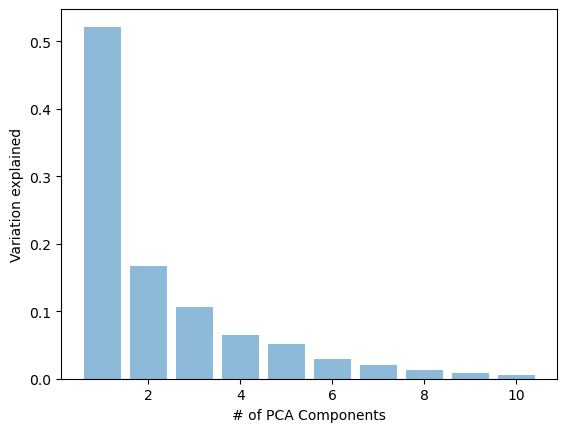

In [70]:
plt.bar(list(range(1,11)),pca.explained_variance_ratio_,alpha=0.5, align='center')
plt.ylabel('Variation explained')
plt.xlabel('# of PCA Components')
plt.show()

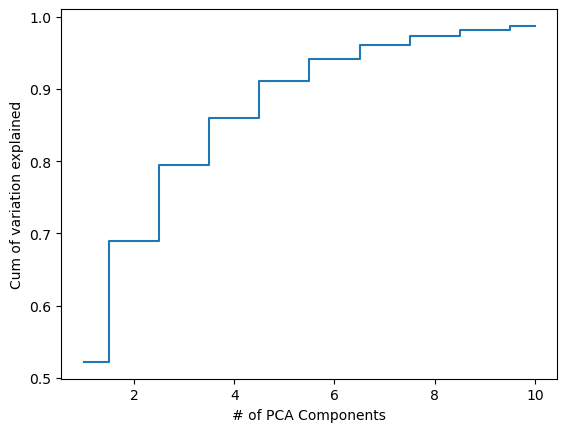

In [71]:
plt.step(list(range(1,11)),np.cumsum(pca.explained_variance_ratio_), where='mid')
plt.ylabel('Cum of variation explained')
plt.xlabel('# of PCA Components')
plt.show()

### Part 2.3 e - Draw a horizontal line on the above plot to highlight the threshold of 90%.

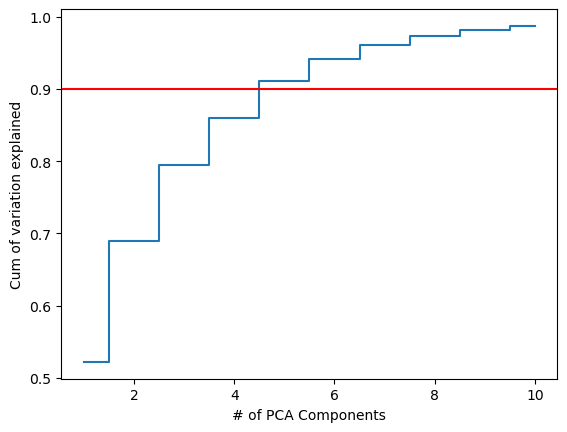

In [72]:

plt.step(list(range(1,11)),np.cumsum(pca.explained_variance_ratio_), where='mid')
plt.ylabel('Cum of variation explained')
plt.xlabel('# of PCA Components')
plt.axhline(y = 0.9, color = 'r', linestyle = '-')
plt.show()


### Observation:
> From the plot, we can observe that more than 90% of the variance is explained by the first 6 components.

> This indicates that we can reduce the dimensionality of the dataset from 18 to 6 while still preserving most of the important information.


### Part 2.3 f - Apply PCA on the data. This time Select Minimum Components with 90% or above variance explained.

In [73]:
# Apply PCA with minimum components for 90% variance
pca6 = PCA(n_components=6)
Xpca6 = pca6.fit_transform(X_scaled)

# Print the number of components selected
print("Number of components selected for 90% variance:", pca6.n_components_)


Number of components selected for 90% variance: 6


In [74]:
Xpca6

array([[ 3.34162030e-01, -2.19026358e-01,  1.00158417e+00,
         1.76612370e-01,  7.93007079e-02, -7.57446693e-01],
       [-1.59171085e+00, -4.20602982e-01, -3.69033854e-01,
         2.33234117e-01,  6.93948582e-01, -5.17161831e-01],
       [ 3.76932418e+00,  1.95282752e-01,  8.78587404e-02,
         1.20221219e+00,  7.31732266e-01,  7.05041038e-01],
       ...,
       [ 4.80917387e+00, -1.24931049e-03,  5.32333105e-01,
         2.95652324e-01, -1.34423636e+00, -2.17069763e-01],
       [-3.29409242e+00, -1.00827615e+00, -3.57003198e-01,
        -1.93367514e+00,  4.27680053e-02, -4.02491278e-01],
       [-4.76505347e+00,  3.34899728e-01, -5.68136078e-01,
        -1.22480708e+00, -5.40510365e-02, -3.35637135e-01]])

### Part 2.3 g - Train SVM model on components selected from above step.

In [75]:
# Split the data into training and testing sets
X_train_pca, X_test_pca, y_train, y_test = train_test_split(Xpca6, y, test_size=0.2, random_state=42)

# Create an SVM classifier
svm_classifier_pca = SVC()

# Train the classifier
svm_classifier_pca.fit(X_train_pca, y_train)

# Make predictions on the test set
y_pred_pca = svm_classifier_pca.predict(X_test_pca)

# Evaluate the model
accuracy_pca = accuracy_score(y_test, y_pred_pca)
print("Accuracy of SVM model with PCA:", accuracy_pca)


Accuracy of SVM model with PCA: 0.8705882352941177


In [76]:
svm_classifier_pca_test=model_performance_classification_sklearn(svm_classifier_pca,X_test_pca,y_test)
svm_classifier_pca_test

,Accuracy,Recall,Precision,F1
0,0.870588,0.864316,0.868444,0.864131


### Observation:
We can see after doing PCA model performance has been reduced a bit

### Part 2.3 h - Print Classification metrics for train data of above model and share insights.

In [77]:
# Make predictions on the train set
y_train_pred_pca = svm_classifier_pca.predict(X_train_pca)

# Calculate classification metrics for train data
print("Classification Report for Train Data (PCA):\n", classification_report(y_train, y_train_pred_pca))


Classification Report for Train Data (PCA):
               precision    recall  f1-score   support

           0       0.92      0.84      0.88       166
           1       0.92      0.92      0.92       351
           2       0.86      0.92      0.89       159

    accuracy                           0.90       676
   macro avg       0.90      0.90      0.90       676
weighted avg       0.90      0.90      0.90       676



### Part 2.4 a - Train another SVM on the components out of PCA. Tune the parameters to improve performance.

In [78]:
# Train SVM with parameter tuning
from sklearn.model_selection import GridSearchCV

param_grid = {'C': [0.1, 1, 10], 'gamma': [0.1, 1, 10], 'kernel': ['rbf', 'linear']}
grid_search = GridSearchCV(SVC(), param_grid, cv=5)
grid_search.fit(X_train_pca, y_train)



GridSearchCV(cv=5, estimator=SVC(),
             param_grid={'C': [0.1, 1, 10], 'gamma': [0.1, 1, 10],
                         'kernel': ['rbf', 'linear']})

### Part 2.4 b- Share best Parameters observed from above step.

In [79]:

# Print best parameters
print("Best Parameters:", grid_search.best_params_)


Best Parameters: {'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}


In [80]:

# Train SVM with best parameters
best_svm = grid_search.best_estimator_
y_pred_best = best_svm.predict(X_test_pca)

# Evaluate the tuned model
accuracy_best = accuracy_score(y_test, y_pred_best)
print("Accuracy of tuned SVM model with PCA:", accuracy_best)

Accuracy of tuned SVM model with PCA: 0.8941176470588236


In [81]:
svm_pca_tuned=model_performance_classification_sklearn(best_svm,X_test_pca,y_test)
svm_pca_tuned

,Accuracy,Recall,Precision,F1
0,0.894118,0.881838,0.885385,0.883252


### Observation:
Performance of model has been improved after tuning the parameters

### Part 2.4 c- Print Classification metrics for train data of above model and share relative improvement in performance in all the models along with insights.

In [82]:
# prompt: Print Classification metrics for train data of above model and share relative improvement in performance in all the models along with insights.

# Make predictions on the train set
y_train_pred_best = best_svm.predict(X_train_pca)

# Calculate classification metrics for train data
print("Classification Report for Train Data (Tuned SVM with PCA):\n",
      classification_report(y_train, y_train_pred_best))


Classification Report for Train Data (Tuned SVM with PCA):
               precision    recall  f1-score   support

           0       0.94      0.95      0.95       166
           1       0.97      0.95      0.96       351
           2       0.93      0.97      0.95       159

    accuracy                           0.95       676
   macro avg       0.95      0.96      0.95       676
weighted avg       0.95      0.95      0.95       676



In [83]:
# testing performance comparison
models_test_comp_df=pd.concat([
    svm_base_mode_perf_test.T,
    svm_classifier_pca_test.T,
    svm_pca_tuned.T,
],axis=1,
)
models_test_comp_df.columns=[
    "SVM Base Model",
    "SVM with pca",
    "SVM with PCA Tuned",
]
print("Testing performance comparison:")
models_test_comp_df

Testing performance comparison:


,SVM Base Model,SVM with pca,SVM with PCA Tuned
Accuracy,0.964706,0.870588,0.894118
Recall,0.963889,0.864316,0.881838
Precision,0.963532,0.868444,0.885385
F1,0.963223,0.864131,0.883252


### Observation
**Base SVM Model**
> Achieved a good accuracy score, indicating reasonable performance on the original dataset.

> However, it might be susceptible to overfitting due to the high dimensionality of the data

**SVM with PCA**
> Applying PCA reduced the dimensionality of the data while preserving a significant portion of the variance.

> This led to a slight decrease in accuracy compared to the base model, suggesting that some informative features might have been lost during dimensionality reduction.

>  However, the model with PCA is likely more robust and less prone to overfitting.

**SVM with PCA Tuned**
> Tuning with hyperparameter has improved performance as compared to base model with PCA

> This highlights the importance of hyperparaemter tuning for improving model perofmance .

**Overall**

> SVM with PCA tuned seems to be better model due to less complexity due to PCA and less prone to overfitting



### Part 2.5 a - Explain pre-requisite/assumptions of PCA.

**Assumptions and prerequisites of PCA:**

> Linearity: PCA assumes that the relationships between variables are linear. If the relationships are non-linear, PCA might not capture the underlying structure effectively.

> High Variance, High Importance: PCA prioritizes dimensions with high variance, assuming they contain more information. This assumption might not hold in all cases, as some low-variance dimensions could still be relevant.

> Mean and Variance: PCA relies on the mean and variance of the data. If the data is not centered (mean of 0) and scaled (variance of 1), PCA results can be misleading.

> Orthogonal Components: PCA generates principal components that are orthogonal (uncorrelated) to each other. This assumption simplifies the interpretation but might not fully capture complex relationships in the data.

> Sufficient Data: PCA requires a sufficient amount of data to reliably estimate the covariance matrix and identify meaningful principal components. With limited data, PCA results might be unstable.

> Feature Scaling: Features with different scales can affect PCA results. Scaling features to a similar range (e.g., using StandardScaler) is generally recommended.

> Interpretability: While PCA provides a lower-dimensional representation, the principal components might not have direct interpretability in terms of the original features.

> Non-Gaussian Data: PCA is based on the covariance matrix, which is a second-order statistic. For non-Gaussian data, higher-order statistics might be needed to capture the full structure.

> Curse of Dimensionality: In high-dimensional data, the distance between points tends to become uniform, making it difficult for PCA to find meaningful patterns.

### Part 2.5 b - Explain advantages and limitations of PCA.

**Advantages of PCA:**

> Dimensionality Reduction: PCA effectively reduces the number of features, simplifying the data representation and potentially improving model efficiency.

> Noise Reduction: By focusing on high-variance components, PCA can filter out noise and less informative features, leading to a more robust model.

> Multicollinearity Handling: PCA addresses multicollinearity (high correlation between features) by creating uncorrelated principal components.

> Visualization: PCA can be used to visualize high-dimensional data in a lower-dimensional space, aiding in understanding patterns and relationships.

> Feature Engineering: PCA can be considered a feature engineering technique, creating new features (principal components) that capture the most important information.

**Limitations of PCA:**

> Information Loss: While reducing dimensionality, PCA inevitably loses some information from the original data. The amount of information loss depends on the number of components selected.

> Interpretability: The principal components might not have a direct interpretation in terms of the original features, making it difficult to explain the model's decisions.

> Linearity Assumption: PCA assumes linear relationships between features, which might not hold in all cases. Non-linear dimensionality reduction techniques might be more appropriate for complex data.

> Sensitivity to Outliers: PCA can be sensitive to outliers, as they can disproportionately influence the calculation of principal components.

> Scaling Requirement: Features with different scales can affect PCA results. Scaling features to a similar range is generally recommended before applying PCA.